In [1]:
from __future__ import print_function, unicode_literals, absolute_import, division
import sys
import numpy as np
import matplotlib
matplotlib.rcParams["image.interpolation"] = 'none'
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

from glob import glob
from tqdm import tqdm
from tifffile import imread
from csbdeep.utils import Path, normalize


from stardist.matching import matching, matching_dataset
from stardist.models import Config2D, StarDist2D, StarDistData2D
from stardist import fill_label_holes, random_label_cmap, calculate_extents, gputools_available

np.random.seed(42)
lbl_cmap = random_label_cmap()

In [2]:
import tensorflow as tf

if tf.config.list_physical_devices('GPU'):
    print('CUDA is available')
else:
    print('CUDA is not available')


CUDA is available


In [3]:
import numpy
numpy.version.version

'1.21.5'

In [4]:
import numpy as np
import xml.etree.ElementTree as ET
import cv2
import random
import matplotlib.pyplot as plt
from skimage import io, transform

def he_to_binary_mask_final(filename):
    im_file = filename + '.tif'
    xml_file = filename + '.xml'

    # Parse the XML file
    xDoc = ET.parse(xml_file)
    Regions = xDoc.findall('.//Region')  # get a list of all the region tags
    xy = []

    for region in Regions:
        vertices = region.findall('.//Vertex')
        xy_region = np.zeros((len(vertices), 2))

        for i, vertex in enumerate(vertices):
            x = float(vertex.get('X'))
            y = float(vertex.get('Y'))
            xy_region[i, :] = [x, y]

        xy.append(xy_region)

    im_info = cv2.imread(im_file)

    nrow, ncol, _ = im_info.shape
    binary_mask = np.zeros((nrow, ncol), dtype=np.uint8)
    color_mask = np.zeros((nrow, ncol, 3), dtype=np.float32)

    for zz, vertices in enumerate(xy, start=1):
        #print(f'Processing object #{zz}')
        smaller_x = vertices[:, 0].astype(int)
        smaller_y = vertices[:, 1].astype(int)

        # Create a mask and add it to the current mask
        # Use logical OR to handle overlapping objects
        polygon = cv2.fillPoly(np.zeros_like(binary_mask), [vertices.astype(int)], 1)
        binary_mask = binary_mask + zz * (1 - np.minimum(1, binary_mask)) * polygon

        # Create a random color mask
        color_mask += np.stack([random.random() * polygon for _ in range(3)], axis=2)

    
    return binary_mask, im_info




X = []
Y = []

for url in tqdm(glob('data/MoNuSegTraining Data/*.tif')):
    # # Call the function with your filename
    binary_mask, image = he_to_binary_mask_final(url.split(".")[0])

#     X.append(image)
#     Y.append(binary_mask)
        
    patch_size = 500
    stride = 500  # Adjust this value if you want overlapping patches

    height, width, _ = image.shape
    
    image = transform.resize(image, (height, width))

    # Calculate the number of patches in rows and columns
    num_rows = (height - patch_size) // stride + 1
    num_cols = (width - patch_size) // stride + 1


    for i in range(num_rows):
        for j in range(num_cols):
            # Calculate the starting and ending coordinates of the patch
            start_x = i * stride
            start_y = j * stride
            end_x = start_x + patch_size
            end_y = start_y + patch_size

            # Extract the patch from the image
            patch = image[start_x:end_x, start_y:end_y]
            mask = binary_mask[start_x:end_x, start_y:end_y]

            # Append the patch to the list
            X.append(patch)
            Y.append(mask)


X_test=[]
Y_test=[]
for url in tqdm(glob('data/MoNuSegTestData/*.tif')):
    # # Call the function with your filename
    binary_mask, image = he_to_binary_mask_final(url.split(".")[0])
    height, width, _ = image.shape
    image = transform.resize(image, (height, width))
    X_test.append(image)
    Y_test.append(binary_mask)

100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [03:19<00:00, 14.26s/it]


In [5]:
#X = [255 - img[:, :, 1] for img in X]
#X_test = [255 - img[:, :, 1] for img in X_test]

n_channel = 1 if X[0].ndim == 2 else X[0].shape[-1]

In [6]:
assert len(X) > 1, "not enough training data"
rng = np.random.RandomState(42)
ind = rng.permutation(len(X))
n_val = max(1, int(round(0.10 * len(ind))))
ind_train, ind_val = ind[:-n_val], ind[-n_val:]
X_val, Y_val = [X[i] for i in ind_val]  , [Y[i] for i in ind_val]
X_trn, Y_trn = [X[i] for i in ind_train], [Y[i] for i in ind_train] 
print('number of images: %3d' % len(X))
print('- training:       %3d' % len(X_trn))
print('- validation:     %3d' % len(X_val))

number of images: 148
- training:       133
- validation:      15


In [7]:
print(np.array(X_trn).shape)
print(np.array(Y_trn).shape)

(133, 500, 500, 3)
(133, 500, 500)


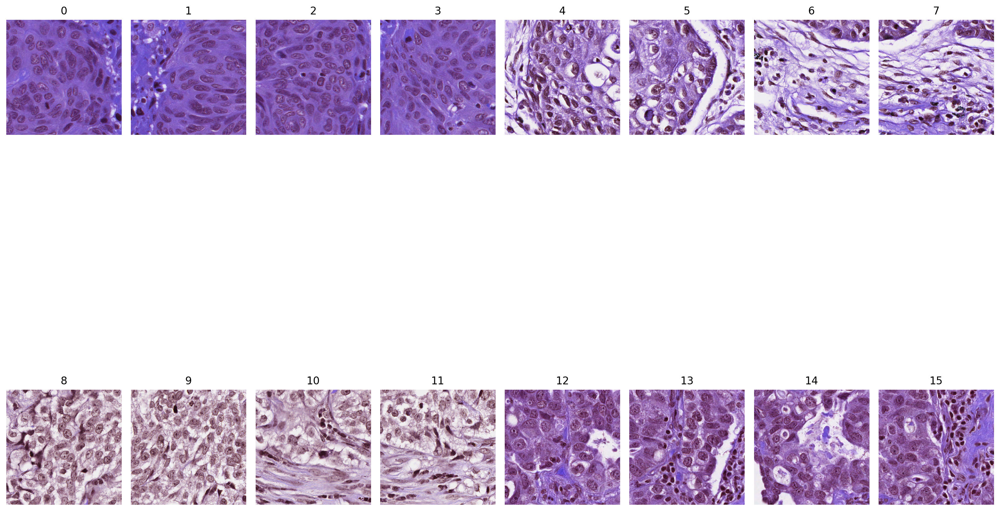

In [8]:
# show all test images
if True:
    fig, ax = plt.subplots(2,8, figsize=(16,16))
    for i,(a,x) in enumerate(zip(ax.flat, X)):
        a.imshow(x)
        a.set_title(i)
    [a.axis('off') for a in ax.flat]
    plt.tight_layout()
None;

In [9]:
def plot_img_label(img, lbl, img_title="image", lbl_title="label", **kwargs):
    fig, (ai,al) = plt.subplots(1,2, figsize=(12,5), gridspec_kw=dict(width_ratios=(1.25,1)))
    im = ai.imshow(img, cmap='gray', clim=(0,1))
    ai.set_title(img_title)    
    fig.colorbar(im, ax=ai)
    al.imshow(lbl, cmap=lbl_cmap)
    al.set_title(lbl_title)
    plt.tight_layout()

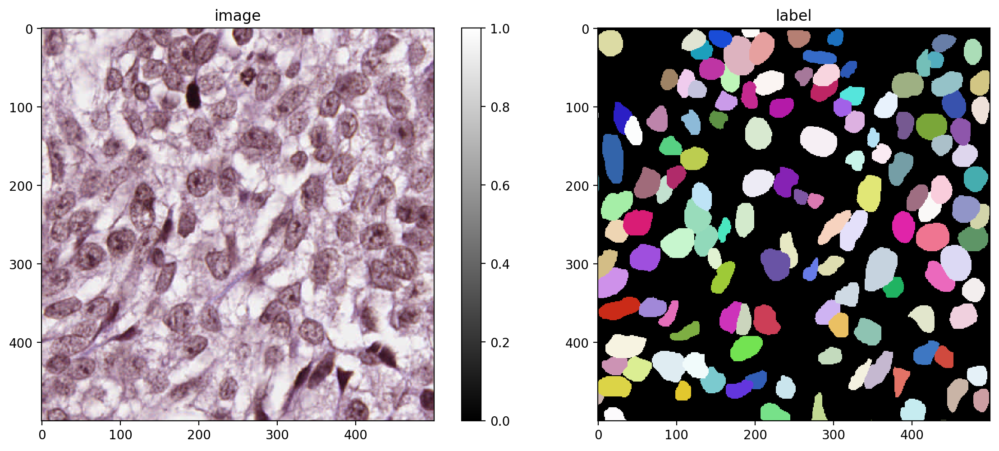

In [10]:
i = min(9, len(X)-1)
img, lbl = X[i], Y[i]
assert img.ndim in (2,3)
img = img if (img.ndim==2 or img.shape[-1]==3) else img[...,0]
plot_img_label(img,lbl)
None;

In [11]:
print(Config2D.__doc__)

Configuration for a :class:`StarDist2D` model.

    Parameters
    ----------
    axes : str or None
        Axes of the input images.
    n_rays : int
        Number of radial directions for the star-convex polygon.
        Recommended to use a power of 2 (default: 32).
    n_channel_in : int
        Number of channels of given input image (default: 1).
    grid : (int,int)
        Subsampling factors (must be powers of 2) for each of the axes.
        Model will predict on a subsampled grid for increased efficiency and larger field of view.
    n_classes : None or int
        Number of object classes to use for multi-class predection (use None to disable)
    backbone : str
        Name of the neural network architecture to be used as backbone.
    kwargs : dict
        Overwrite (or add) configuration attributes (see below).


    Attributes
    ----------
    unet_n_depth : int
        Number of U-Net resolution levels (down/up-sampling layers).
    unet_kernel_size : (int,int)
   

In [12]:
# 32 is a good default choice (see 1_data.ipynb)
n_rays = 32

# Use OpenCL-based computations for data generator during training (requires 'gputools')
use_gpu = False and gputools_available()

# Predict on subsampled grid for increased efficiency and larger field of view
grid = (2,2)

# conf = Config2D (
#     n_rays       = n_rays,
#     grid         = grid,
#     use_gpu      = use_gpu,
#     n_channel_in = n_channel,
#     net_input_shape=(512, 512, 3),
#     train_epochs = 200,
#     n_classes=4,
#     train_patch_size= (512, 512),
# )


conf = Config2D (
    n_rays       = n_rays,
    grid         = grid,
    use_gpu      = use_gpu,
    n_channel_in = n_channel
)

print(conf)
vars(conf)

Config2D(n_dim=2, axes='YXC', n_channel_in=3, n_channel_out=33, train_checkpoint='weights_best.h5', train_checkpoint_last='weights_last.h5', train_checkpoint_epoch='weights_now.h5', n_rays=32, grid=(2, 2), backbone='unet', n_classes=None, unet_n_depth=3, unet_kernel_size=(3, 3), unet_n_filter_base=32, unet_n_conv_per_depth=2, unet_pool=(2, 2), unet_activation='relu', unet_last_activation='relu', unet_batch_norm=False, unet_dropout=0.0, unet_prefix='', net_conv_after_unet=128, net_input_shape=(None, None, 3), net_mask_shape=(None, None, 1), train_shape_completion=False, train_completion_crop=32, train_patch_size=(256, 256), train_background_reg=0.0001, train_foreground_only=0.9, train_sample_cache=True, train_dist_loss='mae', train_loss_weights=(1, 0.2), train_class_weights=(1, 1), train_epochs=400, train_steps_per_epoch=100, train_learning_rate=0.0003, train_batch_size=4, train_n_val_patches=None, train_tensorboard=True, train_reduce_lr={'factor': 0.5, 'patience': 40, 'min_delta': 0}, 

{'n_dim': 2,
 'axes': 'YXC',
 'n_channel_in': 3,
 'n_channel_out': 33,
 'train_checkpoint': 'weights_best.h5',
 'train_checkpoint_last': 'weights_last.h5',
 'train_checkpoint_epoch': 'weights_now.h5',
 'n_rays': 32,
 'grid': (2, 2),
 'backbone': 'unet',
 'n_classes': None,
 'unet_n_depth': 3,
 'unet_kernel_size': (3, 3),
 'unet_n_filter_base': 32,
 'unet_n_conv_per_depth': 2,
 'unet_pool': (2, 2),
 'unet_activation': 'relu',
 'unet_last_activation': 'relu',
 'unet_batch_norm': False,
 'unet_dropout': 0.0,
 'unet_prefix': '',
 'net_conv_after_unet': 128,
 'net_input_shape': (None, None, 3),
 'net_mask_shape': (None, None, 1),
 'train_shape_completion': False,
 'train_completion_crop': 32,
 'train_patch_size': (256, 256),
 'train_background_reg': 0.0001,
 'train_foreground_only': 0.9,
 'train_sample_cache': True,
 'train_dist_loss': 'mae',
 'train_loss_weights': (1, 0.2),
 'train_class_weights': (1, 1),
 'train_epochs': 400,
 'train_steps_per_epoch': 100,
 'train_learning_rate': 0.0003,


In [13]:
if use_gpu:
    from csbdeep.utils.tf import limit_gpu_memory
    # adjust as necessary: limit GPU memory to be used by TensorFlow to leave some to OpenCL-based computations
    limit_gpu_memory(0.8)
    # alternatively, try this:
    # limit_gpu_memory(None, allow_growth=True)

In [14]:
model = StarDist2D(conf, name='resnet_unet_iit', basedir='models')

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input (InputLayer)             [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv2d (Conv2D)                (None, None, None,   896         ['input[0][0]']                  
                                32)                                                               
                                                                                                  
 conv2d_1 (Conv2D)              (None, None, None,   9248        ['conv2d[0][0]']                 
                                32)                                                        

                                                                                                  
 conv2_block2_2_relu (Activatio  (None, None, None,   0          ['conv2_block2_2_bn[0][0]']      
 n)                             64)                                                               
                                                                                                  
 conv2_block2_3_conv (Conv2D)   (None, None, None,   16640       ['conv2_block2_2_relu[0][0]']    
                                256)                                                              
                                                                                                  
 conv2_block2_3_bn (BatchNormal  (None, None, None,   1024       ['conv2_block2_3_conv[0][0]']    
 ization)                       256)                                                              
                                                                                                  
 conv2_blo

                                128)                                                              
                                                                                                  
 conv3_block2_1_bn (BatchNormal  (None, None, None,   512        ['conv3_block2_1_conv[0][0]']    
 ization)                       128)                                                              
                                                                                                  
 conv3_block2_1_relu (Activatio  (None, None, None,   0          ['conv3_block2_1_bn[0][0]']      
 n)                             128)                                                              
                                                                                                  
 conv3_block2_2_conv (Conv2D)   (None, None, None,   147584      ['conv3_block2_1_relu[0][0]']    
                                128)                                                              
          

 conv3_block4_add (Add)         (None, None, None,   0           ['conv3_block3_out[0][0]',       
                                512)                              'conv3_block4_3_bn[0][0]']      
                                                                                                  
 conv3_block4_out (Activation)  (None, None, None,   0           ['conv3_block4_add[0][0]']       
                                512)                                                              
                                                                                                  
 conv4_block1_1_conv (Conv2D)   (None, None, None,   131328      ['conv3_block4_out[0][0]']       
                                256)                                                              
                                                                                                  
 conv4_block1_1_bn (BatchNormal  (None, None, None,   1024       ['conv4_block1_1_conv[0][0]']    
 ization) 

                                                                                                  
 conv4_block3_2_bn (BatchNormal  (None, None, None,   1024       ['conv4_block3_2_conv[0][0]']    
 ization)                       256)                                                              
                                                                                                  
 conv4_block3_2_relu (Activatio  (None, None, None,   0          ['conv4_block3_2_bn[0][0]']      
 n)                             256)                                                              
                                                                                                  
 conv4_block3_3_conv (Conv2D)   (None, None, None,   263168      ['conv4_block3_2_relu[0][0]']    
                                1024)                                                             
                                                                                                  
 conv4_blo

 ization)                       256)                                                              
                                                                                                  
 conv4_block6_1_relu (Activatio  (None, None, None,   0          ['conv4_block6_1_bn[0][0]']      
 n)                             256)                                                              
                                                                                                  
 conv4_block6_2_conv (Conv2D)   (None, None, None,   590080      ['conv4_block6_1_relu[0][0]']    
                                256)                                                              
                                                                                                  
 conv4_block6_2_bn (BatchNormal  (None, None, None,   1024       ['conv4_block6_2_conv[0][0]']    
 ization)                       256)                                                              
          

 conv5_block2_3_bn (BatchNormal  (None, None, None,   8192       ['conv5_block2_3_conv[0][0]']    
 ization)                       2048)                                                             
                                                                                                  
 conv5_block2_add (Add)         (None, None, None,   0           ['conv5_block1_out[0][0]',       
                                2048)                             'conv5_block2_3_bn[0][0]']      
                                                                                                  
 conv5_block2_out (Activation)  (None, None, None,   0           ['conv5_block2_add[0][0]']       
                                2048)                                                             
                                                                                                  
 conv5_block3_1_conv (Conv2D)   (None, None, None,   1049088     ['conv5_block2_out[0][0]']       
          

 n)                             64)                                                               
                                                                                                  
 conv2_block1_2_conv (Conv2D)   (None, None, None,   36928       ['conv2_block1_1_relu[0][0]']    
                                64)                                                               
                                                                                                  
 conv2_block1_2_bn (BatchNormal  (None, None, None,   256        ['conv2_block1_2_conv[0][0]']    
 ization)                       64)                                                               
                                                                                                  
 conv2_block1_2_relu (Activatio  (None, None, None,   0          ['conv2_block1_2_bn[0][0]']      
 n)                             64)                                                               
          

 conv2_block3_add (Add)         (None, None, None,   0           ['conv2_block2_out[0][0]',       
                                256)                              'conv2_block3_3_bn[0][0]']      
                                                                                                  
 conv2_block3_out (Activation)  (None, None, None,   0           ['conv2_block3_add[0][0]']       
                                256)                                                              
                                                                                                  
 conv3_block1_1_conv (Conv2D)   (None, None, None,   32896       ['conv2_block3_out[0][0]']       
                                128)                                                              
                                                                                                  
 conv3_block1_1_bn (BatchNormal  (None, None, None,   512        ['conv3_block1_1_conv[0][0]']    
 ization) 

                                                                                                  
 conv3_block3_2_bn (BatchNormal  (None, None, None,   512        ['conv3_block3_2_conv[0][0]']    
 ization)                       128)                                                              
                                                                                                  
 conv3_block3_2_relu (Activatio  (None, None, None,   0          ['conv3_block3_2_bn[0][0]']      
 n)                             128)                                                              
                                                                                                  
 conv3_block3_3_conv (Conv2D)   (None, None, None,   66048       ['conv3_block3_2_relu[0][0]']    
                                512)                                                              
                                                                                                  
 conv3_blo

                                32)                                                               
                                                                                                  
 up_level_0_no_2 (Conv2D)       (None, None, None,   9248        ['up_level_0_no_0[0][0]']        
                                32)                                                               
                                                                                                  
 features (Conv2D)              (None, None, None,   36992       ['up_level_0_no_2[0][0]']        
                                128)                                                              
                                                                                                  
 prob (Conv2D)                  (None, None, None,   129         ['features[0][0]']               
                                1)                                                                
          

In [15]:
def random_fliprot(img, mask): 
    assert img.ndim >= mask.ndim
    axes = tuple(range(mask.ndim))
    perm = tuple(np.random.permutation(axes))
    img = img.transpose(perm + tuple(range(mask.ndim, img.ndim))) 
    mask = mask.transpose(perm) 
    for ax in axes: 
        if np.random.rand() > 0.5:
            img = np.flip(img, axis=ax)
            mask = np.flip(mask, axis=ax)
    return img, mask 

def random_intensity_change(img):
    img = img*np.random.uniform(0.6,1) + np.random.uniform(-0.2,0.2)
    return img


def augmenter(x, y):
    """Augmentation of a single input/label image pair.
    x is an input image
    y is the corresponding ground-truth label image
    """
    x, y = random_fliprot(x, y)
    x = random_intensity_change(x)
    # add some gaussian noise
    sig = 0.02*np.random.uniform(0,1)
    x = x + sig*np.random.normal(0,1,x.shape)
    return x, y

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


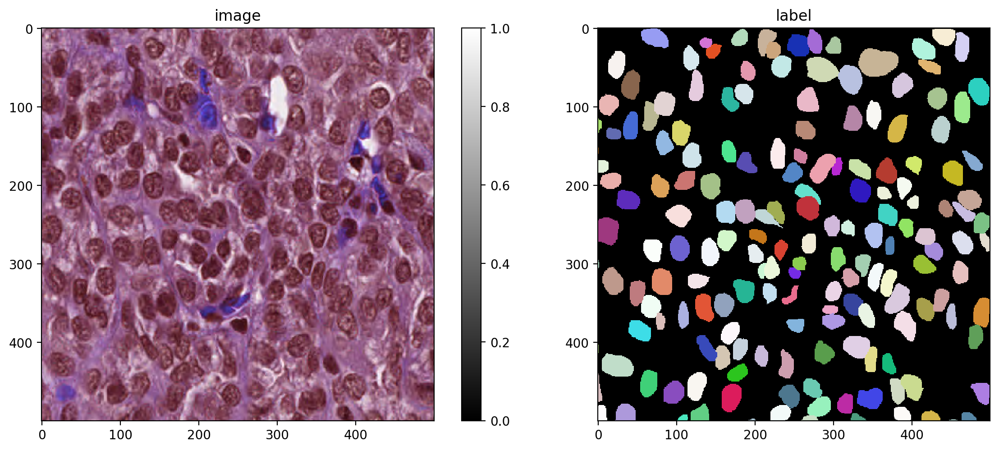

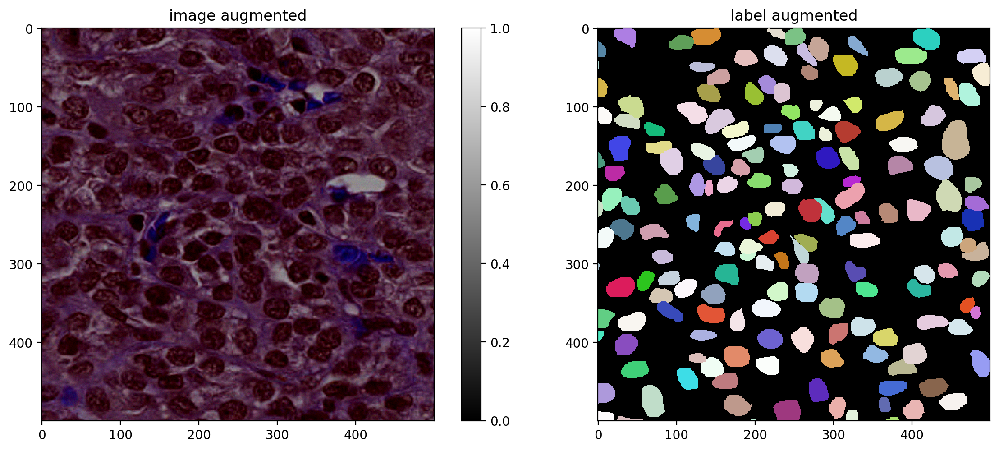

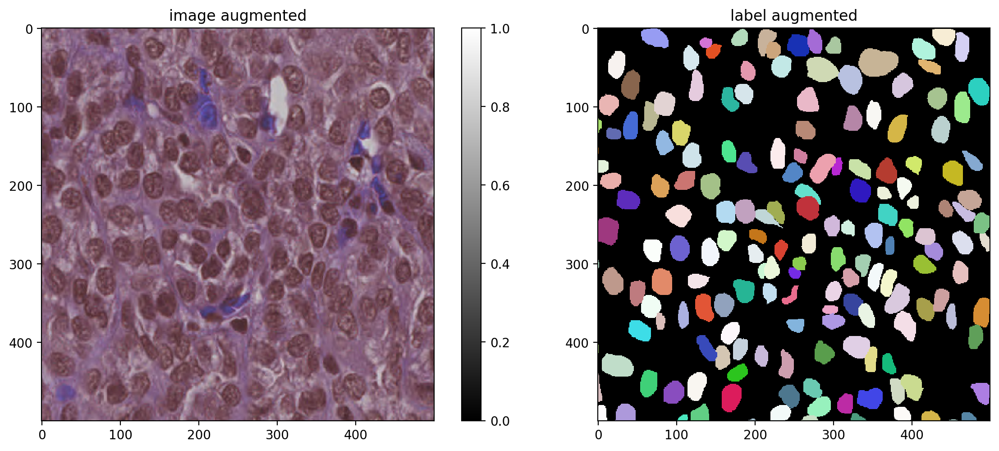

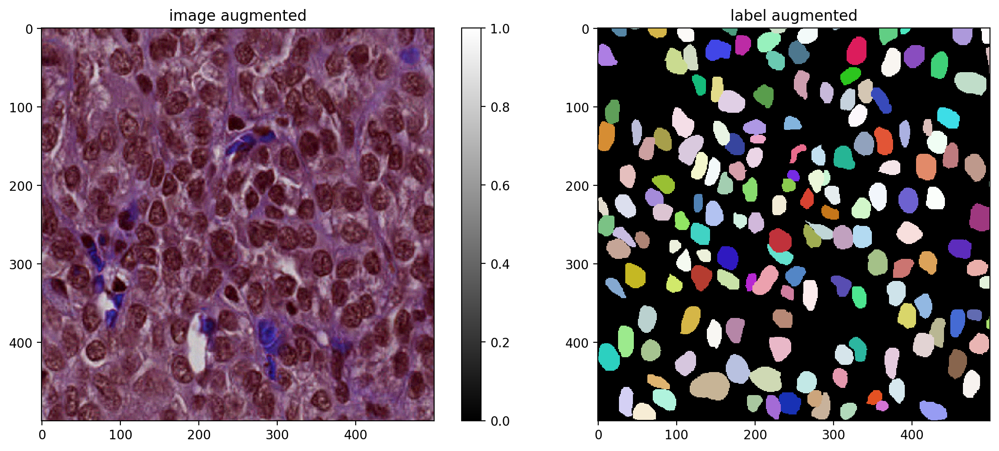

In [16]:
# plot some augmented examples
img, lbl = X_trn[0],Y_trn[0]
plot_img_label(img, lbl)
for _ in range(3):
    img_aug, lbl_aug = augmenter(img,lbl)
    plot_img_label(img_aug, lbl_aug, img_title="image augmented", lbl_title="label augmented")

In [17]:
model.train(X_trn,Y_trn, validation_data=(X_val,Y_val), augmenter=augmenter,
            epochs=200) # 200 epochs seem to be enough for synthetic demo dataset

Epoch 1/200
Cause: Unable to locate the source code of <function _gcd_import at 0x00000246D4811310>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Cause: Unable to locate the source code of <function _gcd_import at 0x00000246D4811310>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate 

Epoch 12/200
100/100 [==============================] - 19s 186ms/step - loss: 0.8253 - prob_loss: 0.2264 - dist_loss: 2.9948 - prob_kld: 0.0707 - dist_relevant_mae: 2.9941 - dist_relevant_mse: 23.2521 - dist_dist_iou_metric: 0.6134 - val_loss: 0.8737 - val_prob_loss: 0.2188 - val_dist_loss: 3.2745 - val_prob_kld: 0.0826 - val_dist_relevant_mae: 3.2738 - val_dist_relevant_mse: 29.1208 - val_dist_dist_iou_metric: 0.5667 - lr: 3.0000e-04
Epoch 13/200
100/100 [==============================] - 19s 192ms/step - loss: 0.8145 - prob_loss: 0.2320 - dist_loss: 2.9126 - prob_kld: 0.0743 - dist_relevant_mae: 2.9118 - dist_relevant_mse: 22.2872 - dist_dist_iou_metric: 0.6231 - val_loss: 0.8215 - val_prob_loss: 0.2098 - val_dist_loss: 3.0586 - val_prob_kld: 0.0735 - val_dist_relevant_mae: 3.0577 - val_dist_relevant_mse: 24.3324 - val_dist_dist_iou_metric: 0.6096 - lr: 3.0000e-04
Epoch 14/200
100/100 [==============================] - 19s 188ms/step - loss: 0.7912 - prob_loss: 0.2261 - dist_loss: 2

Epoch 25/200
100/100 [==============================] - 18s 183ms/step - loss: 0.7531 - prob_loss: 0.2196 - dist_loss: 2.6676 - prob_kld: 0.0642 - dist_relevant_mae: 2.6669 - dist_relevant_mse: 19.1475 - dist_dist_iou_metric: 0.6522 - val_loss: 0.7575 - val_prob_loss: 0.2011 - val_dist_loss: 2.7824 - val_prob_kld: 0.0648 - val_dist_relevant_mae: 2.7817 - val_dist_relevant_mse: 20.7902 - val_dist_dist_iou_metric: 0.6432 - lr: 3.0000e-04
Epoch 26/200
100/100 [==============================] - 19s 186ms/step - loss: 0.7374 - prob_loss: 0.2190 - dist_loss: 2.5921 - prob_kld: 0.0619 - dist_relevant_mae: 2.5914 - dist_relevant_mse: 18.5988 - dist_dist_iou_metric: 0.6624 - val_loss: 0.7406 - val_prob_loss: 0.1987 - val_dist_loss: 2.7096 - val_prob_kld: 0.0625 - val_dist_relevant_mae: 2.7089 - val_dist_relevant_mse: 21.5165 - val_dist_dist_iou_metric: 0.6436 - lr: 3.0000e-04
Epoch 27/200
100/100 [==============================] - 19s 186ms/step - loss: 0.7281 - prob_loss: 0.2206 - dist_loss: 2

Epoch 38/200
100/100 [==============================] - 18s 184ms/step - loss: 0.6926 - prob_loss: 0.2168 - dist_loss: 2.3790 - prob_kld: 0.0601 - dist_relevant_mae: 2.3782 - dist_relevant_mse: 15.9179 - dist_dist_iou_metric: 0.6872 - val_loss: 0.7104 - val_prob_loss: 0.1937 - val_dist_loss: 2.5835 - val_prob_kld: 0.0575 - val_dist_relevant_mae: 2.5828 - val_dist_relevant_mse: 19.2596 - val_dist_dist_iou_metric: 0.6645 - lr: 3.0000e-04
Epoch 39/200
100/100 [==============================] - 18s 185ms/step - loss: 0.7011 - prob_loss: 0.2164 - dist_loss: 2.4234 - prob_kld: 0.0594 - dist_relevant_mae: 2.4227 - dist_relevant_mse: 16.1954 - dist_dist_iou_metric: 0.6833 - val_loss: 0.7091 - val_prob_loss: 0.1955 - val_dist_loss: 2.5680 - val_prob_kld: 0.0592 - val_dist_relevant_mae: 2.5673 - val_dist_relevant_mse: 17.8564 - val_dist_dist_iou_metric: 0.6584 - lr: 3.0000e-04
Epoch 40/200
100/100 [==============================] - 18s 184ms/step - loss: 0.6907 - prob_loss: 0.2144 - dist_loss: 2

Epoch 51/200
100/100 [==============================] - 18s 185ms/step - loss: 0.6840 - prob_loss: 0.2149 - dist_loss: 2.3454 - prob_kld: 0.0592 - dist_relevant_mae: 2.3447 - dist_relevant_mse: 15.2887 - dist_dist_iou_metric: 0.6901 - val_loss: 0.7084 - val_prob_loss: 0.2111 - val_dist_loss: 2.4865 - val_prob_kld: 0.0748 - val_dist_relevant_mae: 2.4857 - val_dist_relevant_mse: 17.9713 - val_dist_dist_iou_metric: 0.6775 - lr: 3.0000e-04
Epoch 52/200
100/100 [==============================] - 18s 184ms/step - loss: 0.6763 - prob_loss: 0.2133 - dist_loss: 2.3147 - prob_kld: 0.0586 - dist_relevant_mae: 2.3140 - dist_relevant_mse: 14.9818 - dist_dist_iou_metric: 0.6932 - val_loss: 0.7045 - val_prob_loss: 0.2009 - val_dist_loss: 2.5184 - val_prob_kld: 0.0646 - val_dist_relevant_mae: 2.5176 - val_dist_relevant_mse: 17.6870 - val_dist_dist_iou_metric: 0.6805 - lr: 3.0000e-04
Epoch 53/200
100/100 [==============================] - 18s 184ms/step - loss: 0.6801 - prob_loss: 0.2147 - dist_loss: 2

Epoch 64/200
100/100 [==============================] - 18s 181ms/step - loss: 0.6696 - prob_loss: 0.2094 - dist_loss: 2.3007 - prob_kld: 0.0571 - dist_relevant_mae: 2.3000 - dist_relevant_mse: 14.5536 - dist_dist_iou_metric: 0.6935 - val_loss: 0.6908 - val_prob_loss: 0.1933 - val_dist_loss: 2.4878 - val_prob_kld: 0.0570 - val_dist_relevant_mae: 2.4871 - val_dist_relevant_mse: 17.4908 - val_dist_dist_iou_metric: 0.6672 - lr: 3.0000e-04
Epoch 65/200
100/100 [==============================] - 18s 184ms/step - loss: 0.6621 - prob_loss: 0.2119 - dist_loss: 2.2508 - prob_kld: 0.0556 - dist_relevant_mae: 2.2501 - dist_relevant_mse: 13.7962 - dist_dist_iou_metric: 0.6998 - val_loss: 0.6859 - val_prob_loss: 0.1917 - val_dist_loss: 2.4709 - val_prob_kld: 0.0555 - val_dist_relevant_mae: 2.4702 - val_dist_relevant_mse: 17.2533 - val_dist_dist_iou_metric: 0.6679 - lr: 3.0000e-04
Epoch 66/200
100/100 [==============================] - 19s 186ms/step - loss: 0.6717 - prob_loss: 0.2117 - dist_loss: 2

Epoch 77/200
100/100 [==============================] - 18s 184ms/step - loss: 0.6600 - prob_loss: 0.2133 - dist_loss: 2.2337 - prob_kld: 0.0566 - dist_relevant_mae: 2.2329 - dist_relevant_mse: 14.0163 - dist_dist_iou_metric: 0.7045 - val_loss: 0.6974 - val_prob_loss: 0.1979 - val_dist_loss: 2.4972 - val_prob_kld: 0.0617 - val_dist_relevant_mae: 2.4965 - val_dist_relevant_mse: 18.2058 - val_dist_dist_iou_metric: 0.6814 - lr: 3.0000e-04
Epoch 78/200
100/100 [==============================] - 18s 183ms/step - loss: 0.6541 - prob_loss: 0.2117 - dist_loss: 2.2121 - prob_kld: 0.0555 - dist_relevant_mae: 2.2114 - dist_relevant_mse: 13.7505 - dist_dist_iou_metric: 0.7049 - val_loss: 0.6819 - val_prob_loss: 0.1905 - val_dist_loss: 2.4569 - val_prob_kld: 0.0543 - val_dist_relevant_mae: 2.4563 - val_dist_relevant_mse: 17.5266 - val_dist_dist_iou_metric: 0.6714 - lr: 3.0000e-04
Epoch 79/200
100/100 [==============================] - 18s 183ms/step - loss: 0.6554 - prob_loss: 0.2098 - dist_loss: 2

Epoch 90/200
100/100 [==============================] - 18s 185ms/step - loss: 0.6465 - prob_loss: 0.2130 - dist_loss: 2.1673 - prob_kld: 0.0543 - dist_relevant_mae: 2.1666 - dist_relevant_mse: 13.3251 - dist_dist_iou_metric: 0.7128 - val_loss: 0.7126 - val_prob_loss: 0.1924 - val_dist_loss: 2.6009 - val_prob_kld: 0.0562 - val_dist_relevant_mae: 2.6002 - val_dist_relevant_mse: 19.3653 - val_dist_dist_iou_metric: 0.6460 - lr: 3.0000e-04
Epoch 91/200
100/100 [==============================] - 18s 184ms/step - loss: 0.6479 - prob_loss: 0.2131 - dist_loss: 2.1740 - prob_kld: 0.0558 - dist_relevant_mae: 2.1733 - dist_relevant_mse: 13.5202 - dist_dist_iou_metric: 0.7114 - val_loss: 0.6662 - val_prob_loss: 0.1900 - val_dist_loss: 2.3813 - val_prob_kld: 0.0537 - val_dist_relevant_mae: 2.3806 - val_dist_relevant_mse: 16.8295 - val_dist_dist_iou_metric: 0.6847 - lr: 3.0000e-04
Epoch 92/200
100/100 [==============================] - 18s 182ms/step - loss: 0.6370 - prob_loss: 0.2065 - dist_loss: 2

Epoch 103/200
100/100 [==============================] - 18s 185ms/step - loss: 0.6335 - prob_loss: 0.2109 - dist_loss: 2.1132 - prob_kld: 0.0529 - dist_relevant_mae: 2.1125 - dist_relevant_mse: 12.5521 - dist_dist_iou_metric: 0.7188 - val_loss: 0.6888 - val_prob_loss: 0.1971 - val_dist_loss: 2.4583 - val_prob_kld: 0.0608 - val_dist_relevant_mae: 2.4576 - val_dist_relevant_mse: 19.0780 - val_dist_dist_iou_metric: 0.6823 - lr: 3.0000e-04
Epoch 104/200
100/100 [==============================] - 18s 184ms/step - loss: 0.6338 - prob_loss: 0.2090 - dist_loss: 2.1242 - prob_kld: 0.0523 - dist_relevant_mae: 2.1235 - dist_relevant_mse: 12.7969 - dist_dist_iou_metric: 0.7155 - val_loss: 0.6905 - val_prob_loss: 0.1921 - val_dist_loss: 2.4924 - val_prob_kld: 0.0558 - val_dist_relevant_mae: 2.4917 - val_dist_relevant_mse: 18.7453 - val_dist_dist_iou_metric: 0.6744 - lr: 3.0000e-04
Epoch 105/200
100/100 [==============================] - 18s 184ms/step - loss: 0.6432 - prob_loss: 0.2084 - dist_loss

Epoch 116/200
100/100 [==============================] - 18s 183ms/step - loss: 0.6202 - prob_loss: 0.2057 - dist_loss: 2.0721 - prob_kld: 0.0512 - dist_relevant_mae: 2.0714 - dist_relevant_mse: 12.0898 - dist_dist_iou_metric: 0.7198 - val_loss: 0.6615 - val_prob_loss: 0.1919 - val_dist_loss: 2.3481 - val_prob_kld: 0.0556 - val_dist_relevant_mae: 2.3474 - val_dist_relevant_mse: 16.5932 - val_dist_dist_iou_metric: 0.6938 - lr: 3.0000e-04
Epoch 117/200
100/100 [==============================] - 18s 185ms/step - loss: 0.6243 - prob_loss: 0.2097 - dist_loss: 2.0730 - prob_kld: 0.0519 - dist_relevant_mae: 2.0723 - dist_relevant_mse: 12.1829 - dist_dist_iou_metric: 0.7221 - val_loss: 0.6876 - val_prob_loss: 0.1940 - val_dist_loss: 2.4679 - val_prob_kld: 0.0577 - val_dist_relevant_mae: 2.4671 - val_dist_relevant_mse: 18.6129 - val_dist_dist_iou_metric: 0.6749 - lr: 3.0000e-04
Epoch 118/200
100/100 [==============================] - 18s 183ms/step - loss: 0.6296 - prob_loss: 0.2074 - dist_loss

Epoch 129/200
100/100 [==============================] - 18s 184ms/step - loss: 0.6213 - prob_loss: 0.2078 - dist_loss: 2.0673 - prob_kld: 0.0515 - dist_relevant_mae: 2.0666 - dist_relevant_mse: 12.2087 - dist_dist_iou_metric: 0.7245 - val_loss: 0.6515 - val_prob_loss: 0.1902 - val_dist_loss: 2.3067 - val_prob_kld: 0.0539 - val_dist_relevant_mae: 2.3060 - val_dist_relevant_mse: 16.5291 - val_dist_dist_iou_metric: 0.7022 - lr: 3.0000e-04
Epoch 130/200
100/100 [==============================] - 18s 183ms/step - loss: 0.6241 - prob_loss: 0.2068 - dist_loss: 2.0864 - prob_kld: 0.0513 - dist_relevant_mae: 2.0857 - dist_relevant_mse: 12.3183 - dist_dist_iou_metric: 0.7209 - val_loss: 0.6552 - val_prob_loss: 0.1896 - val_dist_loss: 2.3282 - val_prob_kld: 0.0534 - val_dist_relevant_mae: 2.3275 - val_dist_relevant_mse: 16.4100 - val_dist_dist_iou_metric: 0.6999 - lr: 3.0000e-04
Epoch 131/200
100/100 [==============================] - 18s 183ms/step - loss: 0.6183 - prob_loss: 0.2069 - dist_loss

Epoch 142/200
100/100 [==============================] - 18s 182ms/step - loss: 0.6166 - prob_loss: 0.2058 - dist_loss: 2.0541 - prob_kld: 0.0512 - dist_relevant_mae: 2.0534 - dist_relevant_mse: 12.0968 - dist_dist_iou_metric: 0.7264 - val_loss: 0.6545 - val_prob_loss: 0.1924 - val_dist_loss: 2.3105 - val_prob_kld: 0.0562 - val_dist_relevant_mae: 2.3097 - val_dist_relevant_mse: 16.1372 - val_dist_dist_iou_metric: 0.6979 - lr: 3.0000e-04
Epoch 143/200
100/100 [==============================] - 18s 184ms/step - loss: 0.6120 - prob_loss: 0.2075 - dist_loss: 2.0228 - prob_kld: 0.0505 - dist_relevant_mae: 2.0221 - dist_relevant_mse: 11.6697 - dist_dist_iou_metric: 0.7272 - val_loss: 0.6520 - val_prob_loss: 0.1927 - val_dist_loss: 2.2963 - val_prob_kld: 0.0565 - val_dist_relevant_mae: 2.2956 - val_dist_relevant_mse: 15.7917 - val_dist_dist_iou_metric: 0.7026 - lr: 3.0000e-04
Epoch 144/200
100/100 [==============================] - 18s 183ms/step - loss: 0.6189 - prob_loss: 0.2060 - dist_loss

Epoch 155/200
100/100 [==============================] - 18s 185ms/step - loss: 0.6175 - prob_loss: 0.2059 - dist_loss: 2.0580 - prob_kld: 0.0509 - dist_relevant_mae: 2.0573 - dist_relevant_mse: 12.1245 - dist_dist_iou_metric: 0.7214 - val_loss: 0.6451 - val_prob_loss: 0.1898 - val_dist_loss: 2.2768 - val_prob_kld: 0.0535 - val_dist_relevant_mae: 2.2761 - val_dist_relevant_mse: 15.0880 - val_dist_dist_iou_metric: 0.6958 - lr: 3.0000e-04
Epoch 156/200
100/100 [==============================] - 18s 182ms/step - loss: 0.6214 - prob_loss: 0.2059 - dist_loss: 2.0773 - prob_kld: 0.0505 - dist_relevant_mae: 2.0766 - dist_relevant_mse: 12.2940 - dist_dist_iou_metric: 0.7240 - val_loss: 0.6560 - val_prob_loss: 0.1943 - val_dist_loss: 2.3084 - val_prob_kld: 0.0580 - val_dist_relevant_mae: 2.3076 - val_dist_relevant_mse: 16.2521 - val_dist_dist_iou_metric: 0.7010 - lr: 3.0000e-04
Epoch 157/200
100/100 [==============================] - 18s 184ms/step - loss: 0.6067 - prob_loss: 0.2021 - dist_loss

Epoch 168/200
100/100 [==============================] - 18s 184ms/step - loss: 0.6077 - prob_loss: 0.2058 - dist_loss: 2.0096 - prob_kld: 0.0495 - dist_relevant_mae: 2.0089 - dist_relevant_mse: 11.3525 - dist_dist_iou_metric: 0.7308 - val_loss: 0.6474 - val_prob_loss: 0.1885 - val_dist_loss: 2.2945 - val_prob_kld: 0.0523 - val_dist_relevant_mae: 2.2938 - val_dist_relevant_mse: 15.4050 - val_dist_dist_iou_metric: 0.7040 - lr: 3.0000e-04
Epoch 169/200
100/100 [==============================] - 19s 187ms/step - loss: 0.6146 - prob_loss: 0.2083 - dist_loss: 2.0315 - prob_kld: 0.0497 - dist_relevant_mae: 2.0308 - dist_relevant_mse: 11.9424 - dist_dist_iou_metric: 0.7298 - val_loss: 0.6334 - val_prob_loss: 0.1901 - val_dist_loss: 2.2163 - val_prob_kld: 0.0538 - val_dist_relevant_mae: 2.2156 - val_dist_relevant_mse: 14.9452 - val_dist_dist_iou_metric: 0.7086 - lr: 3.0000e-04
Epoch 170/200
100/100 [==============================] - 18s 182ms/step - loss: 0.6033 - prob_loss: 0.2050 - dist_loss

Epoch 181/200
100/100 [==============================] - 18s 185ms/step - loss: 0.6103 - prob_loss: 0.2080 - dist_loss: 2.0118 - prob_kld: 0.0498 - dist_relevant_mae: 2.0111 - dist_relevant_mse: 11.5077 - dist_dist_iou_metric: 0.7312 - val_loss: 0.6492 - val_prob_loss: 0.1904 - val_dist_loss: 2.2941 - val_prob_kld: 0.0542 - val_dist_relevant_mae: 2.2934 - val_dist_relevant_mse: 16.5870 - val_dist_dist_iou_metric: 0.6988 - lr: 3.0000e-04
Epoch 182/200
100/100 [==============================] - 18s 183ms/step - loss: 0.6074 - prob_loss: 0.2045 - dist_loss: 2.0149 - prob_kld: 0.0493 - dist_relevant_mae: 2.0142 - dist_relevant_mse: 11.6679 - dist_dist_iou_metric: 0.7286 - val_loss: 0.6553 - val_prob_loss: 0.1933 - val_dist_loss: 2.3101 - val_prob_kld: 0.0570 - val_dist_relevant_mae: 2.3095 - val_dist_relevant_mse: 16.6849 - val_dist_dist_iou_metric: 0.7030 - lr: 3.0000e-04
Epoch 183/200
100/100 [==============================] - 18s 185ms/step - loss: 0.6049 - prob_loss: 0.2059 - dist_loss

Epoch 194/200
100/100 [==============================] - 18s 184ms/step - loss: 0.6083 - prob_loss: 0.2054 - dist_loss: 2.0141 - prob_kld: 0.0496 - dist_relevant_mae: 2.0134 - dist_relevant_mse: 11.3420 - dist_dist_iou_metric: 0.7302 - val_loss: 0.6634 - val_prob_loss: 0.1919 - val_dist_loss: 2.3574 - val_prob_kld: 0.0557 - val_dist_relevant_mae: 2.3568 - val_dist_relevant_mse: 17.5856 - val_dist_dist_iou_metric: 0.6921 - lr: 3.0000e-04
Epoch 195/200
100/100 [==============================] - 18s 182ms/step - loss: 0.6032 - prob_loss: 0.2033 - dist_loss: 1.9997 - prob_kld: 0.0490 - dist_relevant_mae: 1.9990 - dist_relevant_mse: 11.0664 - dist_dist_iou_metric: 0.7303 - val_loss: 0.6514 - val_prob_loss: 0.1897 - val_dist_loss: 2.3082 - val_prob_kld: 0.0535 - val_dist_relevant_mae: 2.3075 - val_dist_relevant_mse: 16.6732 - val_dist_dist_iou_metric: 0.7035 - lr: 3.0000e-04
Epoch 196/200
100/100 [==============================] - 18s 183ms/step - loss: 0.5996 - prob_loss: 0.2052 - dist_loss